# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [6]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [7]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [10]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - 1)**2)
    #### END CODE HERE ####
    return penalty

In [11]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [14]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [15]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [22]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda*gp
    #### END CODE HERE ####
    return crit_loss

In [23]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.09015872206538916, critic loss: 1.8884066552966832


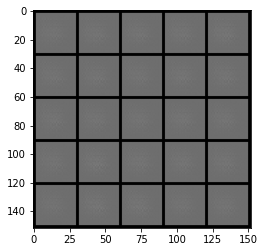

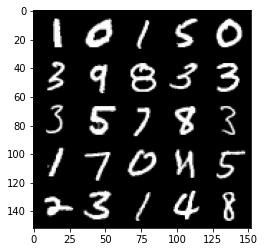

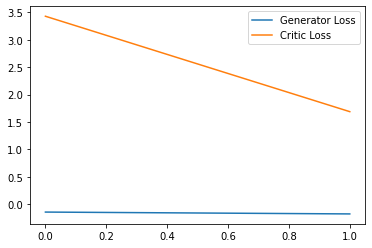

Step 100: Generator loss: 0.8779047153890133, critic loss: -1.7963141269981862


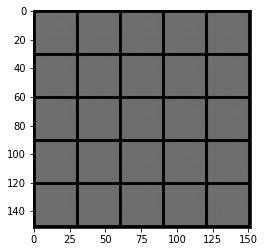

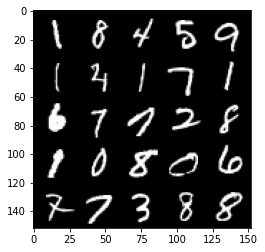

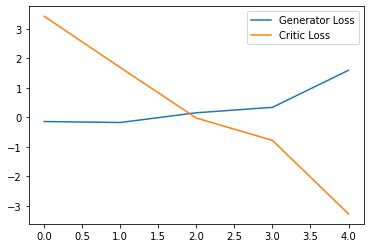

Step 150: Generator loss: 3.478089051246643, critic loss: -10.693274526596072


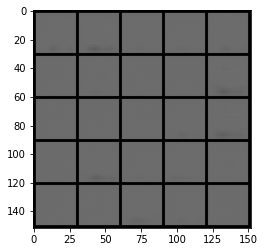

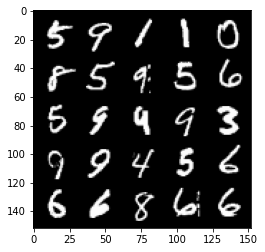

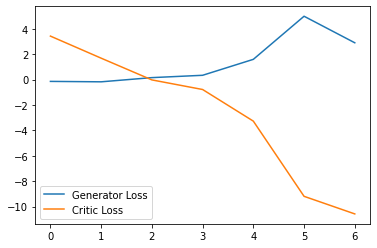

Step 200: Generator loss: 0.125018719881773, critic loss: -24.409806743621825


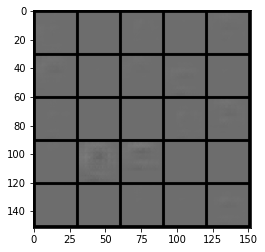

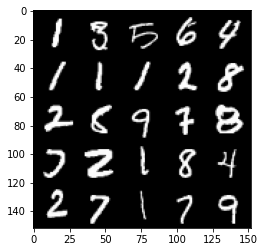

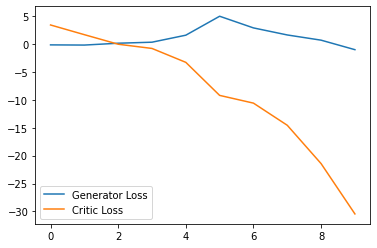

Step 250: Generator loss: -0.8852165344357491, critic loss: -53.41026934814453


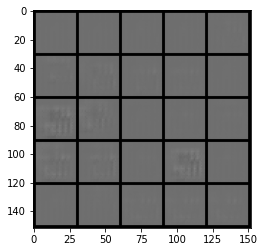

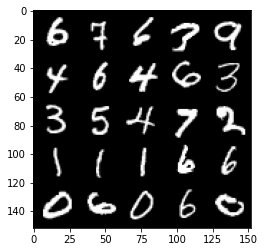

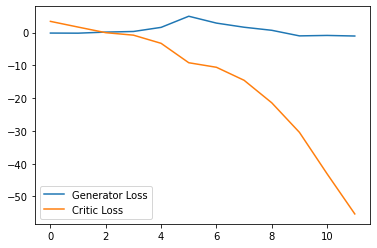

Step 300: Generator loss: -0.8585863023996353, critic loss: -92.60878150939939


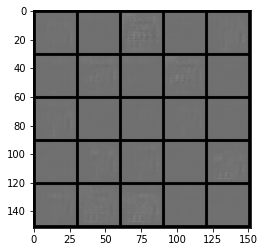

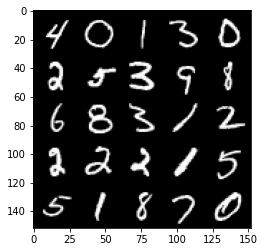

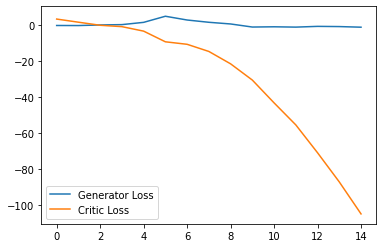

Step 350: Generator loss: 1.5272615617513656, critic loss: -142.59517224121092


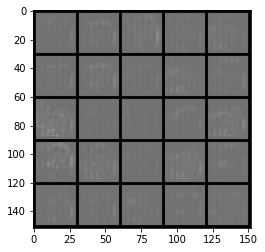

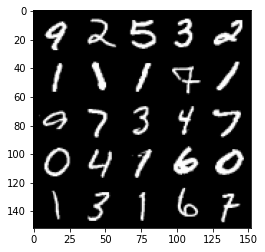

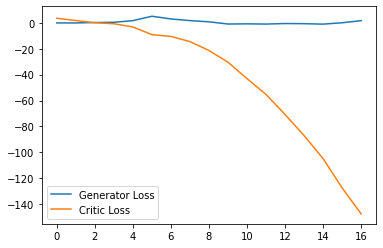

Step 400: Generator loss: 8.481191320419311, critic loss: -202.38036779785153


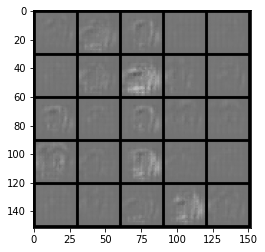

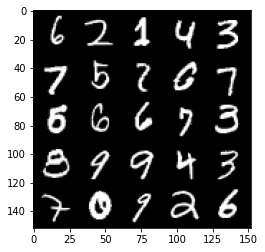

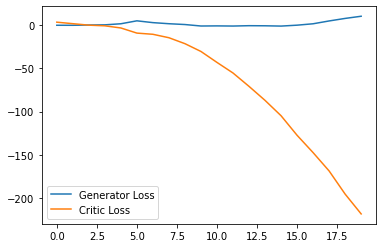

Step 450: Generator loss: 11.693037405014039, critic loss: -256.172085571289


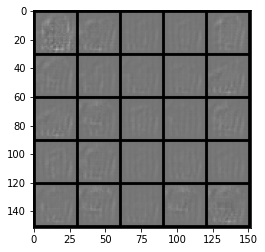

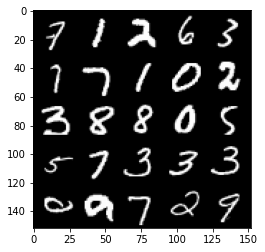

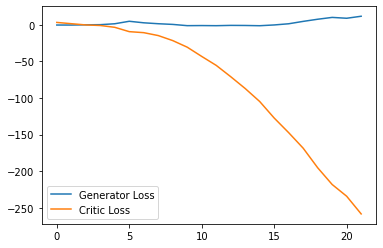

Step 500: Generator loss: 17.343944177627563, critic loss: -317.15241314697266


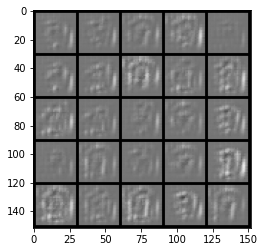

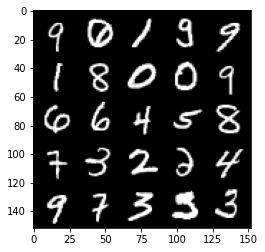

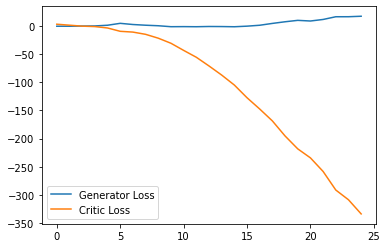

Step 550: Generator loss: 7.674853030443192, critic loss: -321.9282399902343


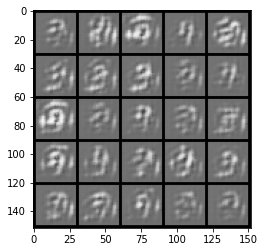

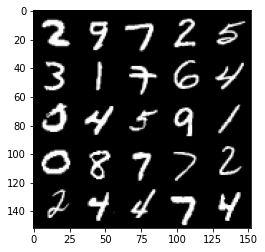

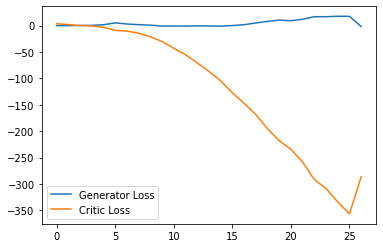

Step 600: Generator loss: -24.675576194524766, critic loss: -240.45238641357423


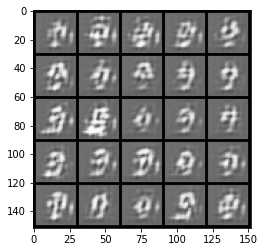

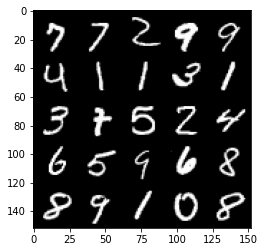

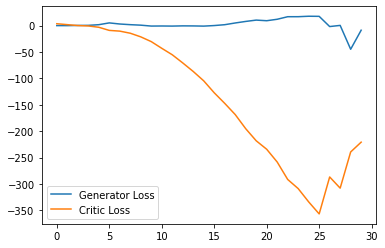

Step 650: Generator loss: 19.606270837783814, critic loss: -280.1617164611817


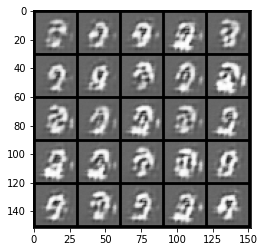

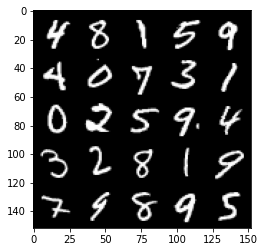

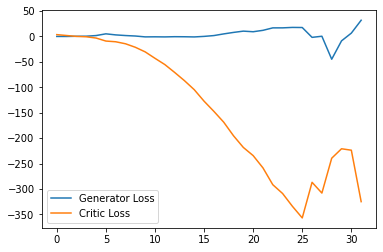

Step 700: Generator loss: -32.55114365100861, critic loss: -244.2733968811035


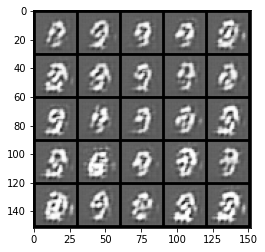

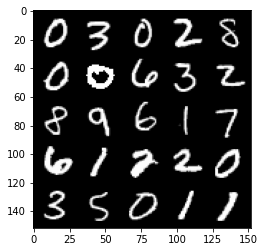

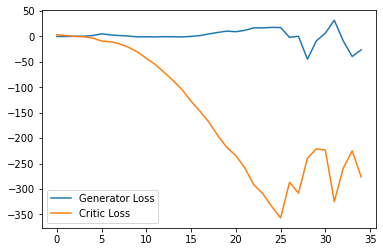

Step 750: Generator loss: 18.890781049132347, critic loss: -308.4897055969239


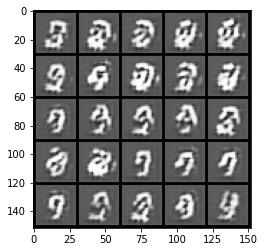

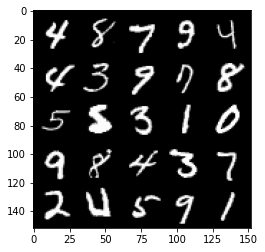

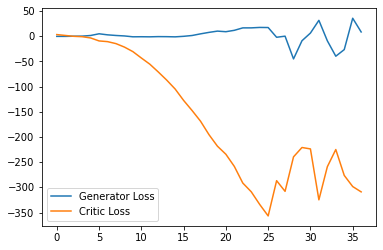

Step 800: Generator loss: -9.700703132152558, critic loss: -223.01626583862304


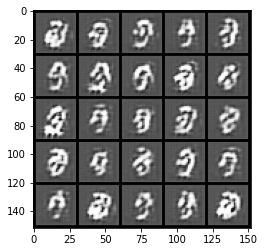

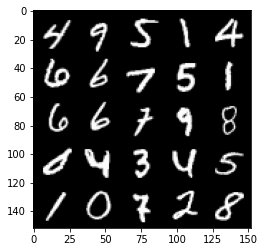

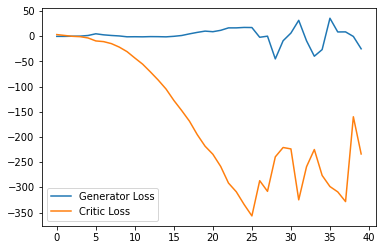

Step 850: Generator loss: -4.2811030006408695, critic loss: -209.87750434875485


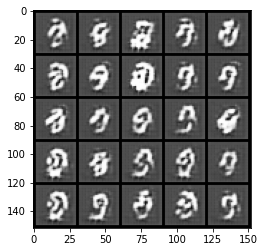

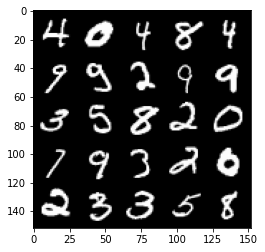

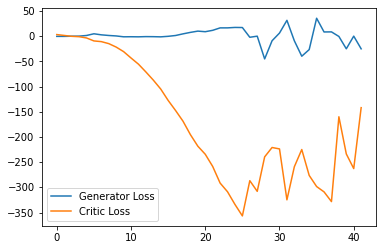

Step 900: Generator loss: -17.17795780181885, critic loss: -177.39867790222164


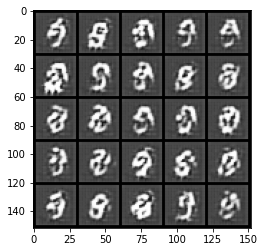

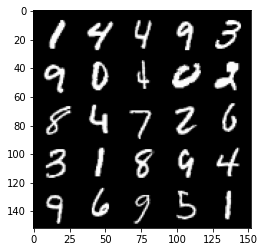

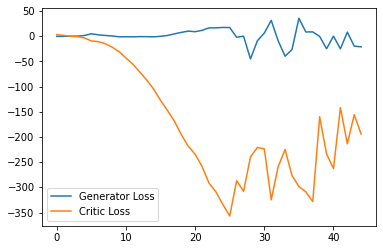

Step 950: Generator loss: -10.411781940460205, critic loss: -145.29272194290152


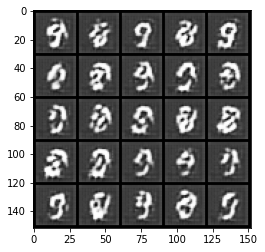

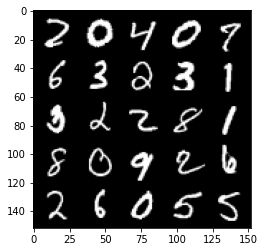

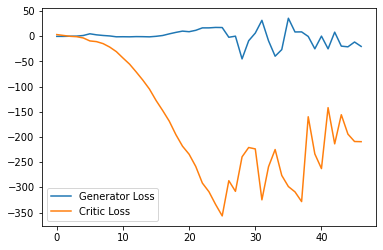

Step 1000: Generator loss: 7.412341756820679, critic loss: 18.122400047302243


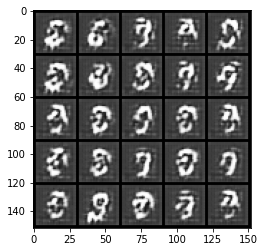

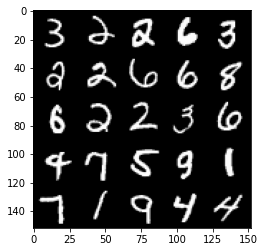

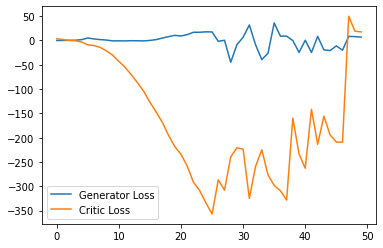

Step 1050: Generator loss: 0.4467196413874626, critic loss: 4.7998381690978995


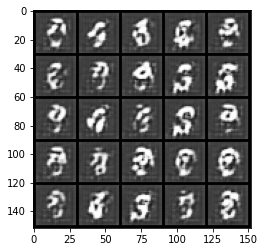

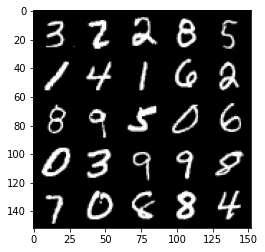

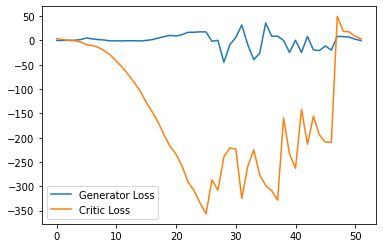

Step 1100: Generator loss: -13.512813293933869, critic loss: -19.209014934539795


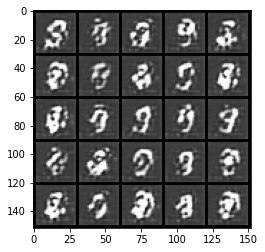

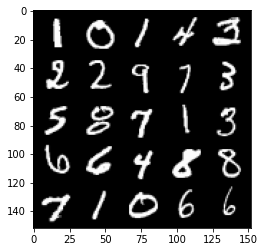

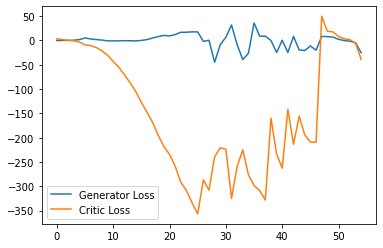

Step 1150: Generator loss: -47.59893362045288, critic loss: -112.86705950927735


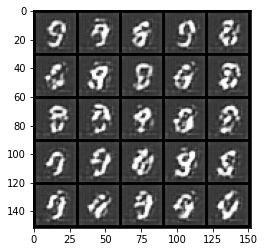

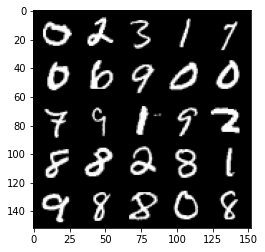

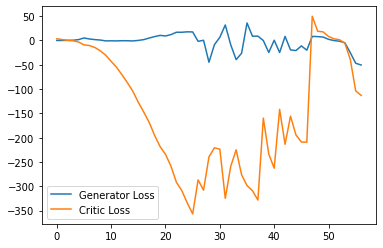

Step 1200: Generator loss: -40.124013109207155, critic loss: -121.28822499084474


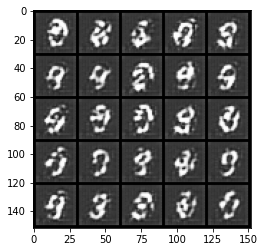

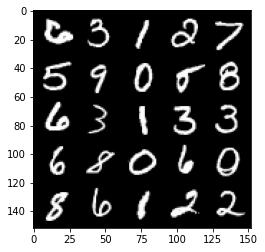

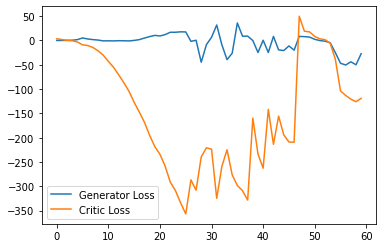

Step 1250: Generator loss: -8.691542868614198, critic loss: -86.7777492904663


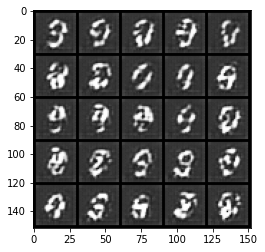

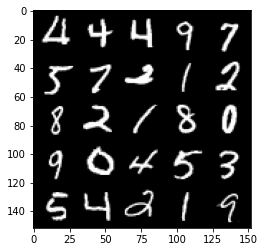

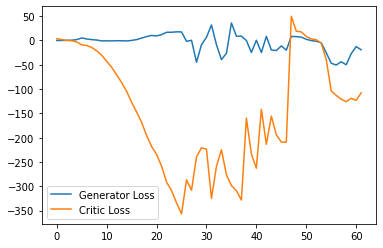

Step 1300: Generator loss: 7.236180974841118, critic loss: 3.3160903472900394


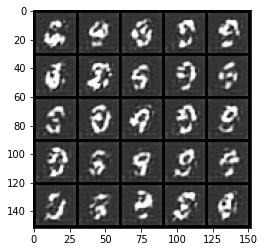

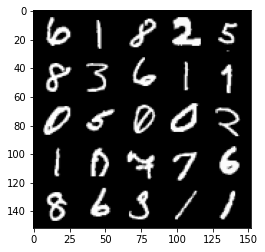

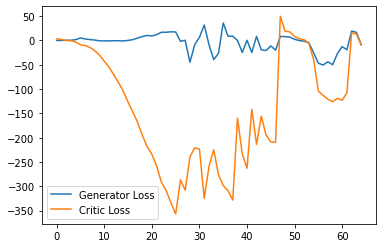

Step 1350: Generator loss: -27.807110347747802, critic loss: -57.15753428649904


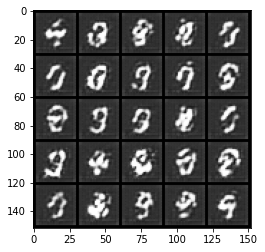

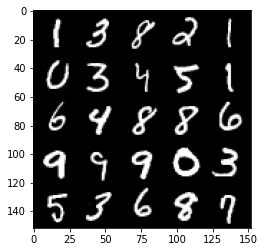

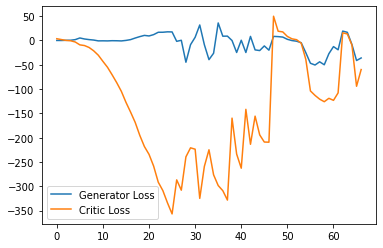

Step 1400: Generator loss: 10.22357650756836, critic loss: 13.72621335220337


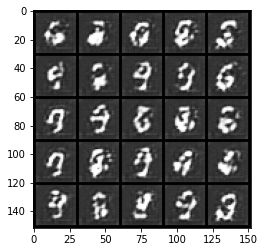

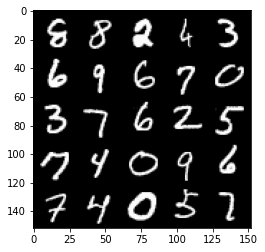

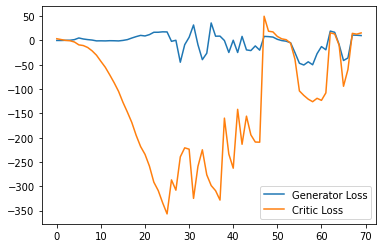

Step 1450: Generator loss: 8.98817873954773, critic loss: 9.095021926879884


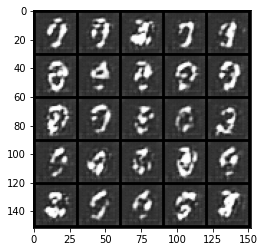

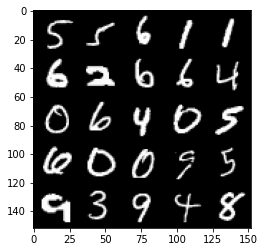

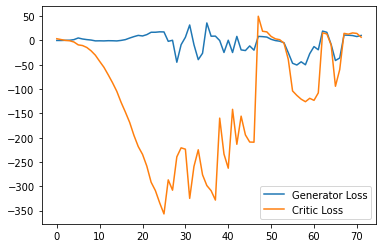

Step 1500: Generator loss: 4.242159566879272, critic loss: 0.021749595642089586


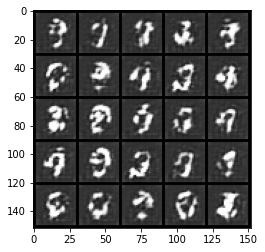

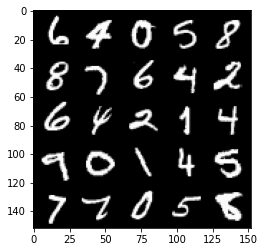

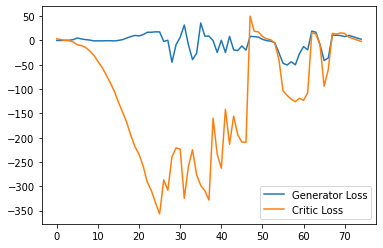

Step 1550: Generator loss: -3.147234197705984, critic loss: -12.397400974273683


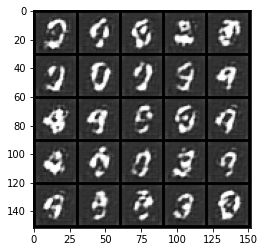

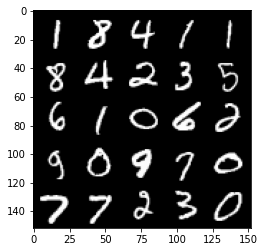

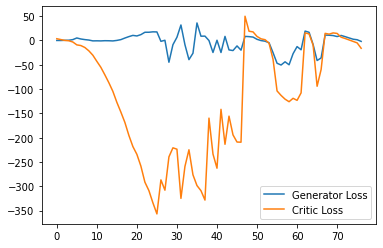

Step 1600: Generator loss: -6.576007990837097, critic loss: -23.570931385040282


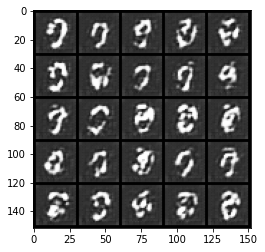

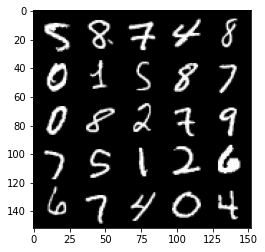

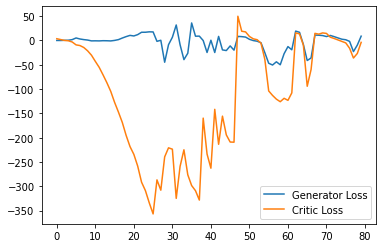

Step 1650: Generator loss: -18.80338436961174, critic loss: -44.7160372314453


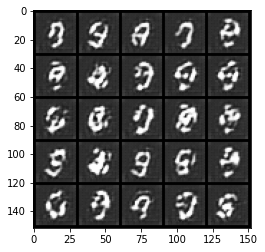

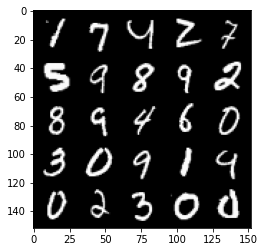

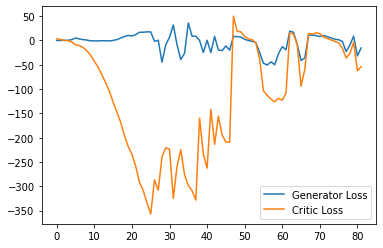

Step 1700: Generator loss: -2.095473924279213, critic loss: -9.986502243041992


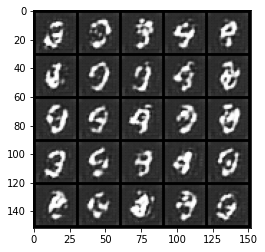

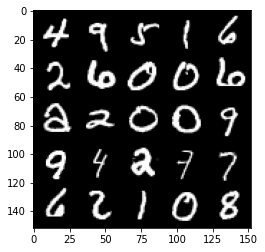

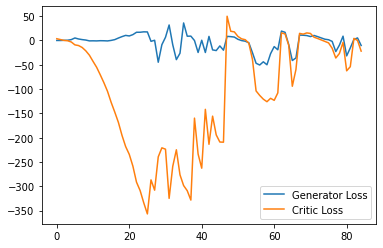

Step 1750: Generator loss: -24.83528983771801, critic loss: -46.224463245391846


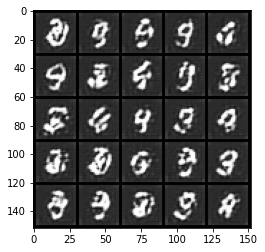

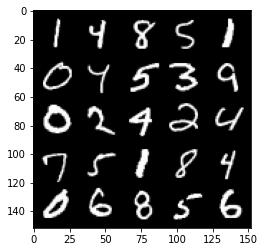

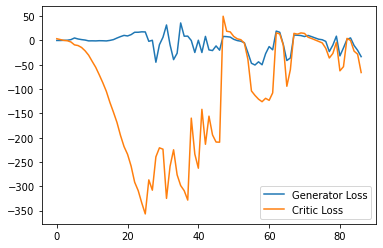

Step 1800: Generator loss: -19.538442112207413, critic loss: -29.381608390808115


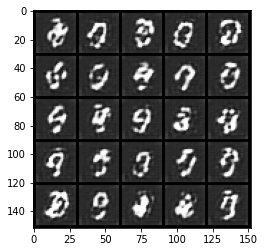

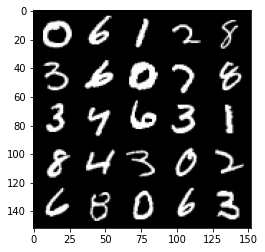

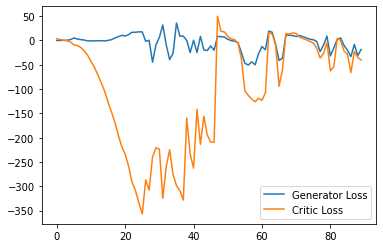

Step 1850: Generator loss: -18.013344594836234, critic loss: -48.86448503875732


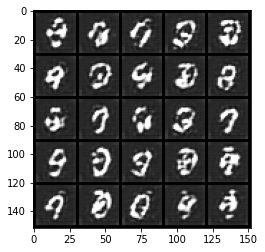

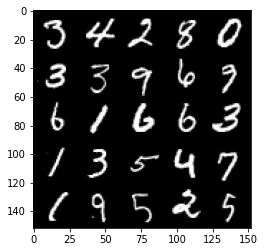

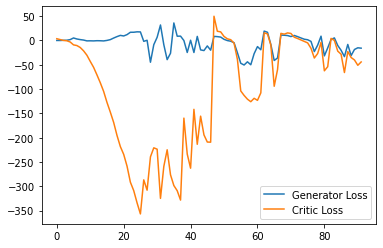

Step 1900: Generator loss: -11.487327083945274, critic loss: -22.72910251045227


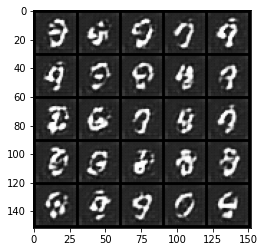

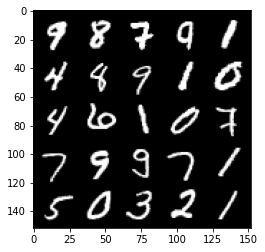

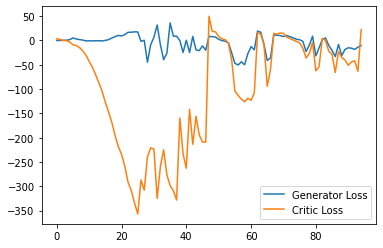

Step 1950: Generator loss: 12.827279815673828, critic loss: 5.655310331344603


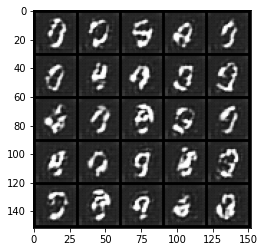

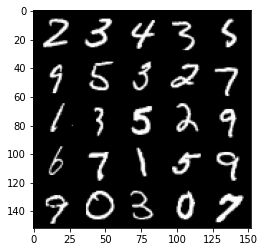

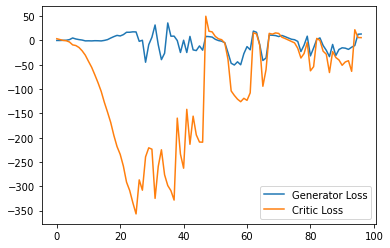

Step 2000: Generator loss: 10.85733211517334, critic loss: 4.441490072250365


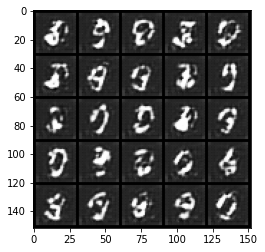

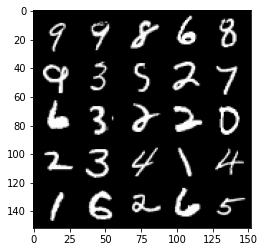

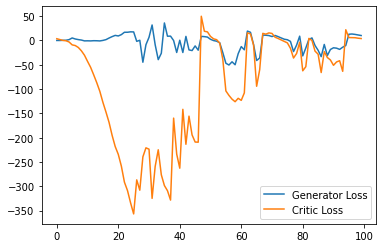

Step 2050: Generator loss: 7.1334916114807125, critic loss: 6.956970420837404


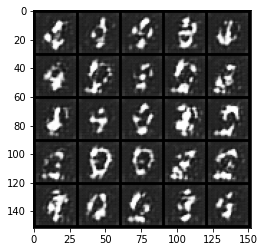

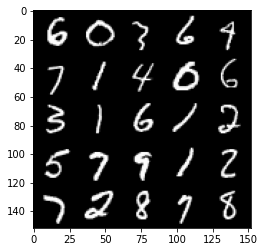

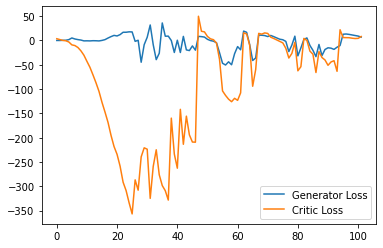

Step 2100: Generator loss: 0.9504092101752758, critic loss: 7.212542768478394


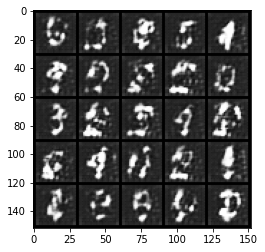

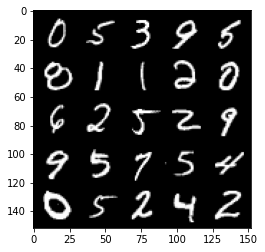

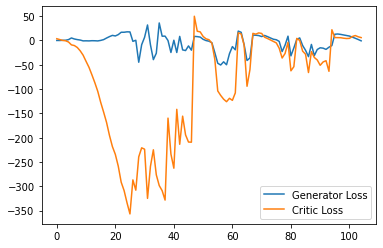

Step 2150: Generator loss: -5.848030314445496, critic loss: 7.365974321365355


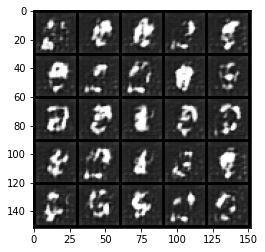

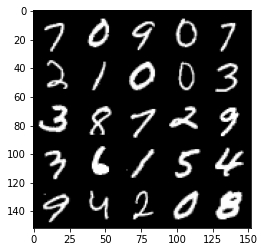

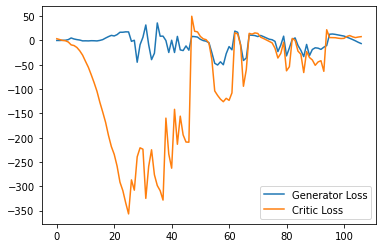

Step 2200: Generator loss: -8.76896378517151, critic loss: 7.759193584442139


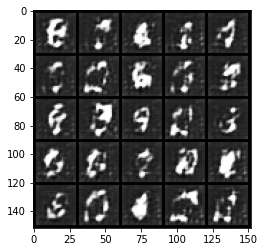

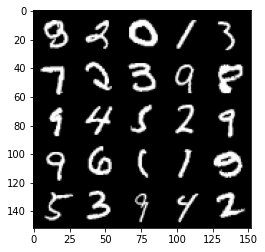

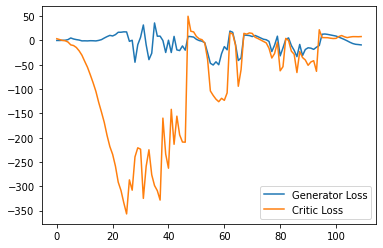

Step 2250: Generator loss: -11.014519653320313, critic loss: 11.458075345993038


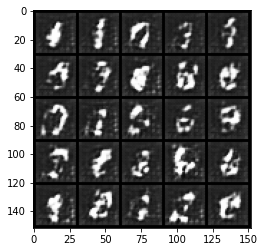

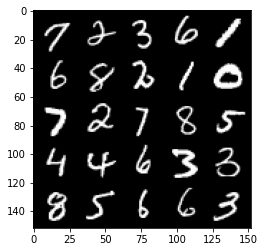

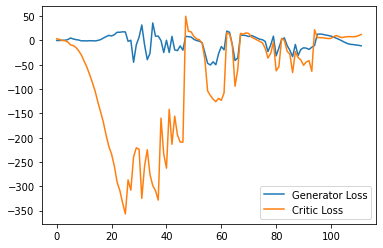

Step 2300: Generator loss: -15.087631015777587, critic loss: 15.676886600494383


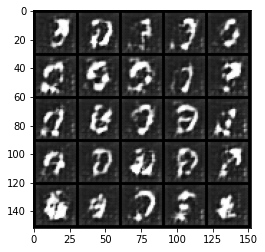

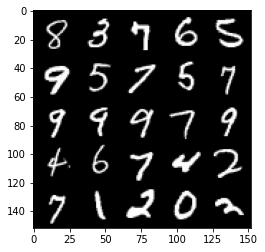

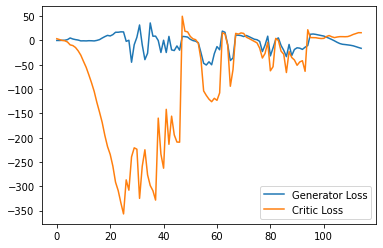

Step 2350: Generator loss: -19.46880699157715, critic loss: 14.337432693481444


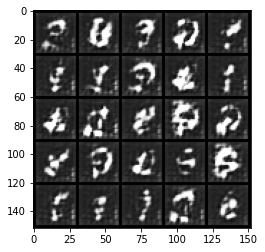

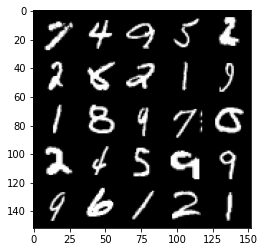

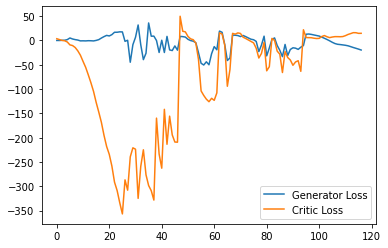

Step 2400: Generator loss: -23.20185260772705, critic loss: 9.754157766342162


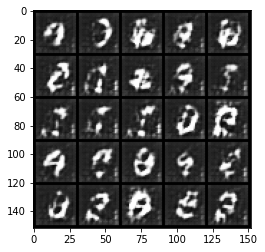

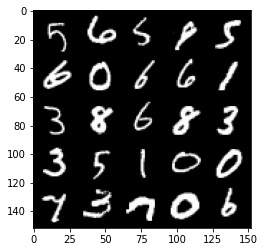

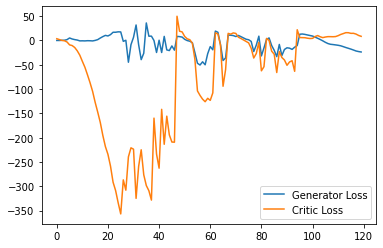

Step 2450: Generator loss: -24.522105903625487, critic loss: 5.743791364669797


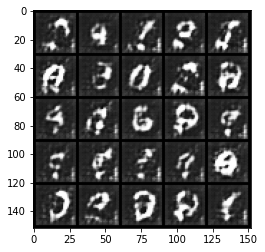

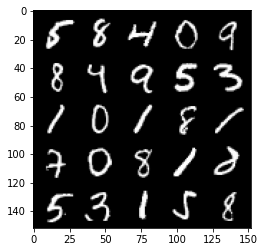

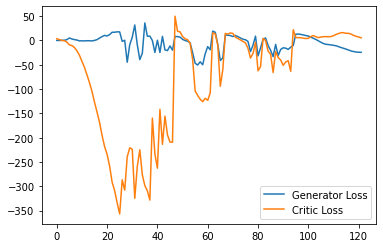

Step 2500: Generator loss: -24.160688209533692, critic loss: 3.75884780216217


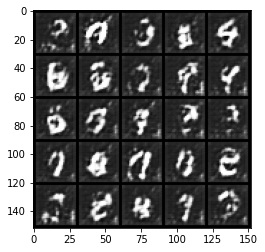

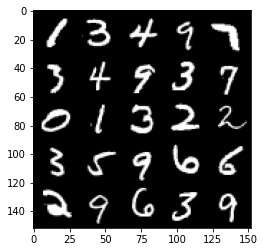

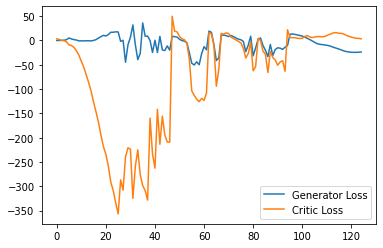

Step 2550: Generator loss: -23.76119270324707, critic loss: 2.5581708297729495


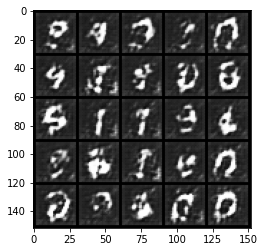

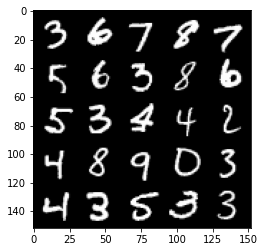

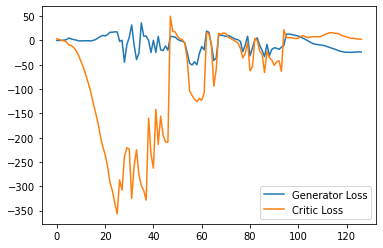

Step 2600: Generator loss: -24.596412162780762, critic loss: 0.7716198244094847


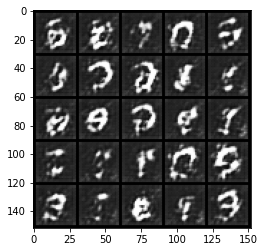

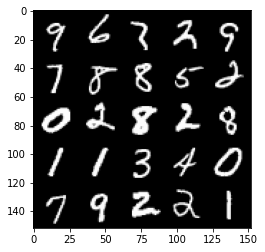

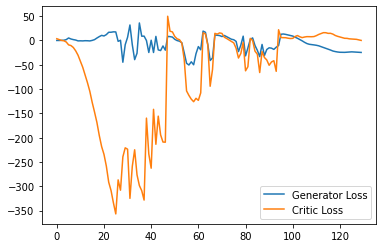

Step 2650: Generator loss: -24.164070739746094, critic loss: -1.9880428695678711


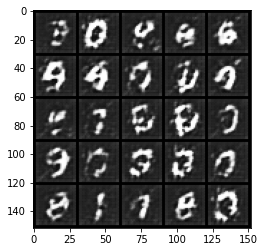

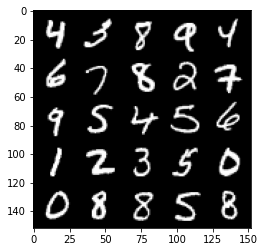

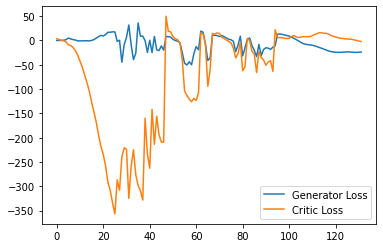

Step 2700: Generator loss: -24.032827072143554, critic loss: -3.522317399024964


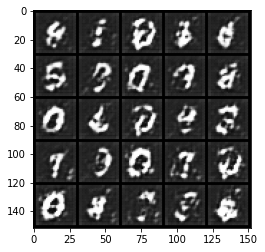

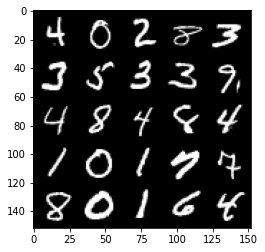

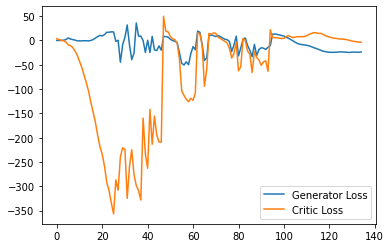

Step 2750: Generator loss: -23.155004234313964, critic loss: -4.945643369674682


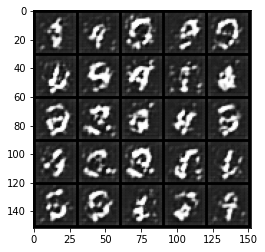

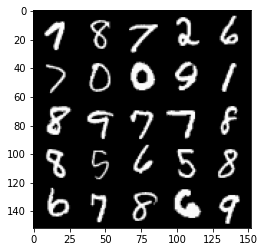

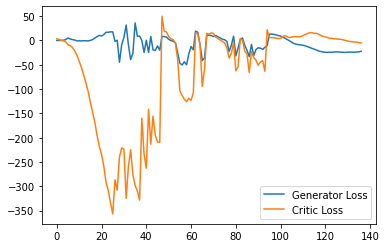

Step 2800: Generator loss: -24.73968494415283, critic loss: -6.500861618041991


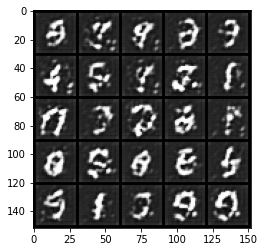

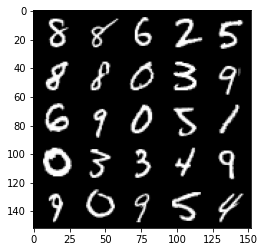

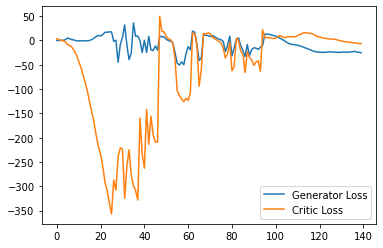

Step 2850: Generator loss: -23.59832187652588, critic loss: -8.180462097167968


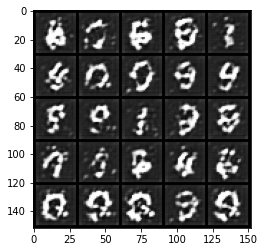

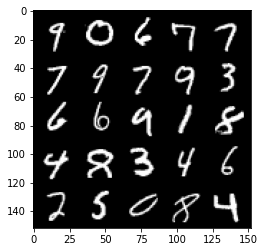

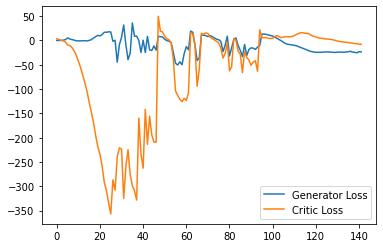

Step 2900: Generator loss: -22.15317321777344, critic loss: -9.819289924621579


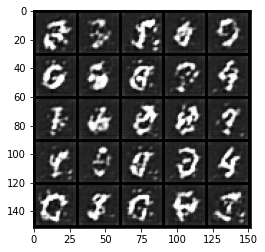

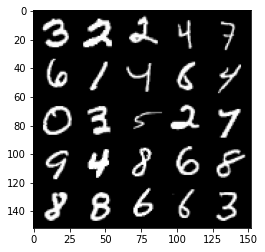

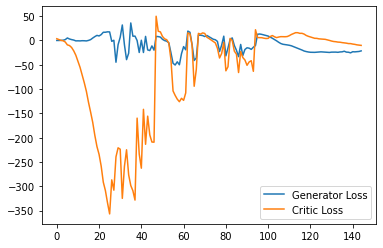

Step 2950: Generator loss: -20.245121059417723, critic loss: -10.970135337829591


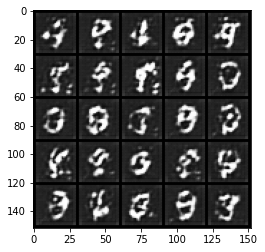

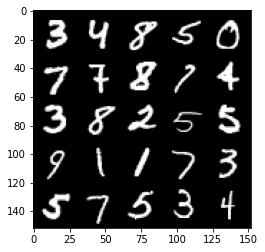

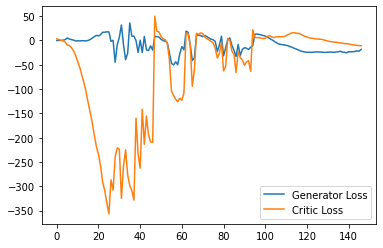

Step 3000: Generator loss: -17.145619678497315, critic loss: -11.732532569885253


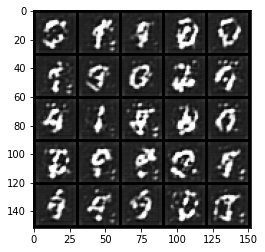

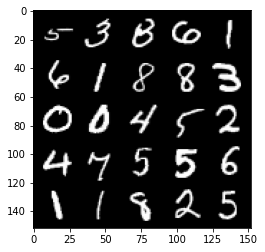

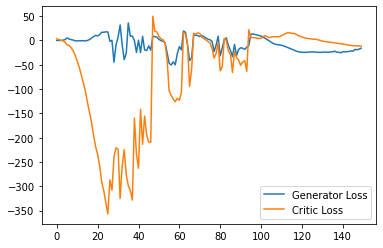

Step 3050: Generator loss: -15.985355949401855, critic loss: -11.971084827423095


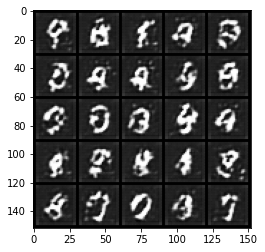

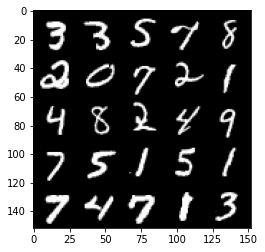

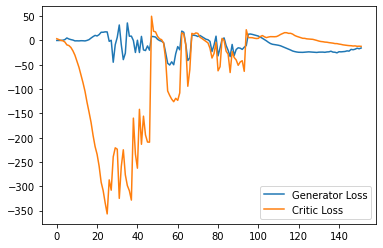

Step 3100: Generator loss: -12.312453660964966, critic loss: -13.314852495193486


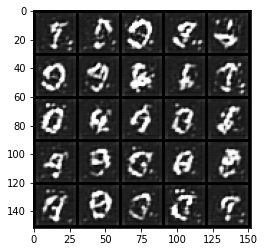

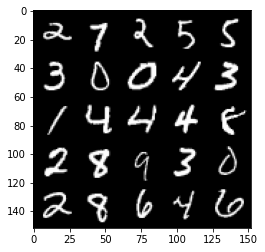

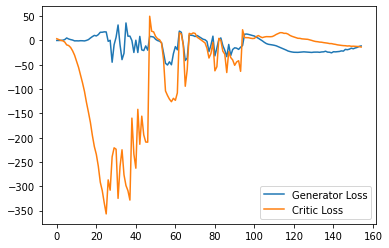

Step 3150: Generator loss: -12.230445618629455, critic loss: -13.384350217819213


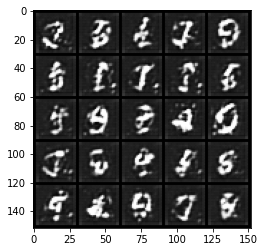

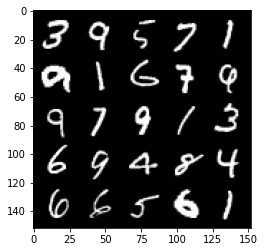

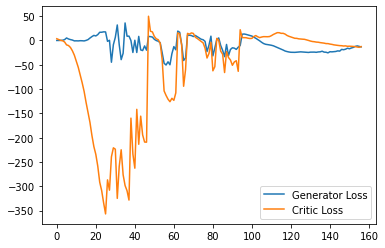

Step 3200: Generator loss: -9.996986684799195, critic loss: -13.58539295864105


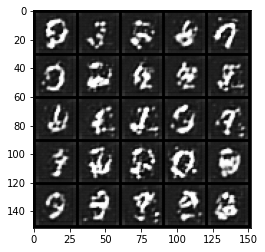

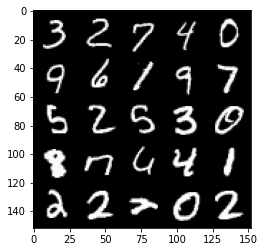

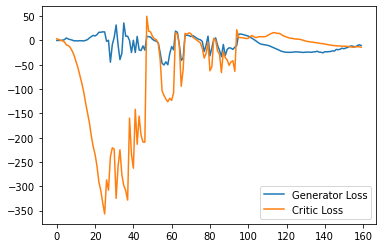

Step 3250: Generator loss: -7.182725222706795, critic loss: -13.716352930068965


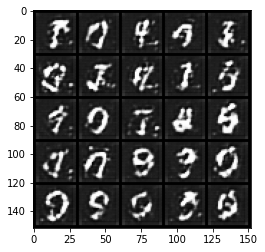

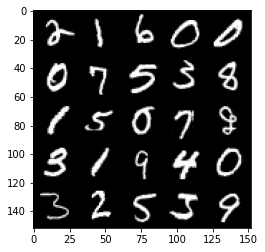

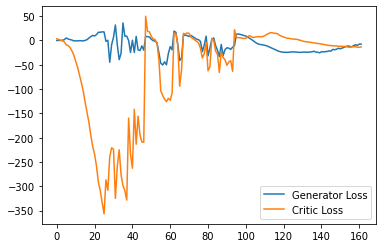

Step 3300: Generator loss: -5.560415246486664, critic loss: -1.935886475086212


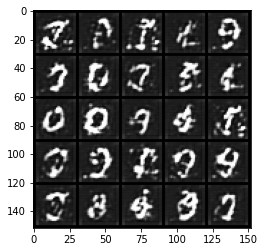

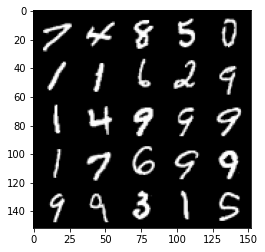

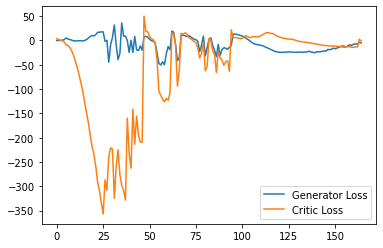

Step 3350: Generator loss: -9.135885467529297, critic loss: -2.7892860660552987


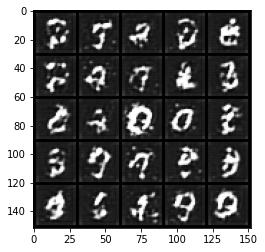

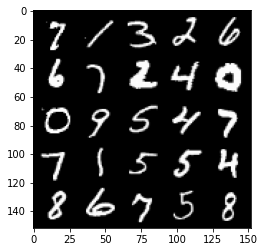

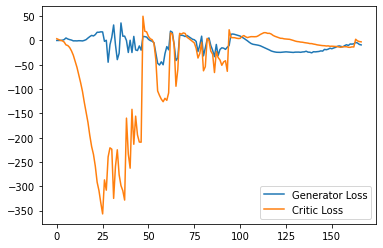

Step 3400: Generator loss: -11.399131641387939, critic loss: -3.4280334081649784


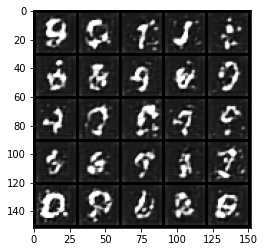

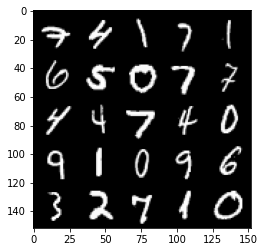

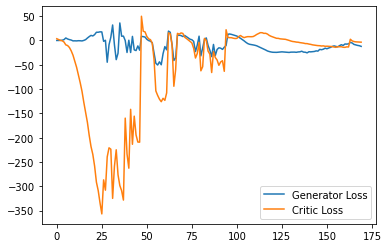

Step 3450: Generator loss: -15.257082233428955, critic loss: -5.677102852821348


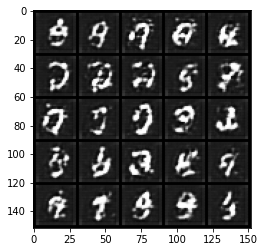

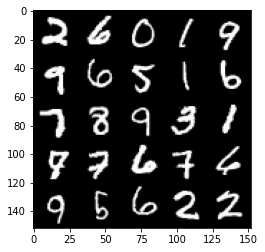

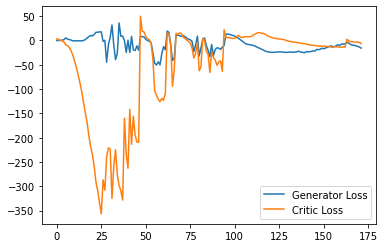

Step 3500: Generator loss: -13.473399314880371, critic loss: -3.9684646706581113


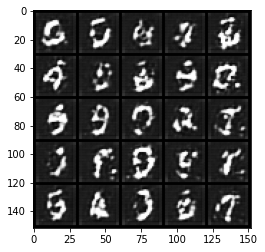

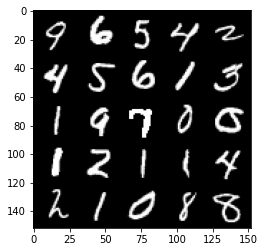

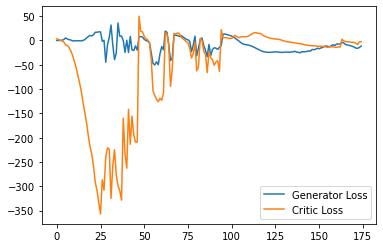

Step 3550: Generator loss: -14.446555547714233, critic loss: -5.650686389923095


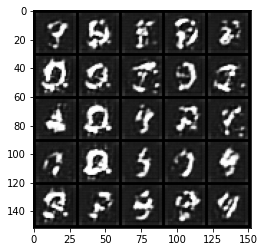

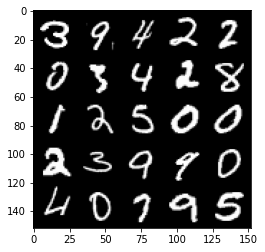

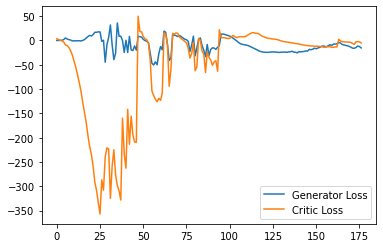

Step 3600: Generator loss: -14.596050987243652, critic loss: -2.3325033917427063


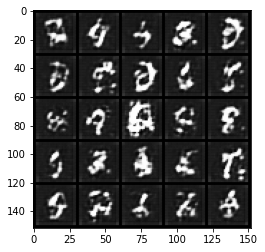

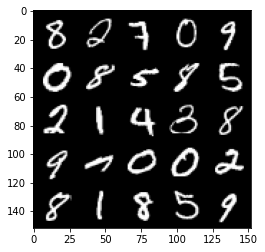

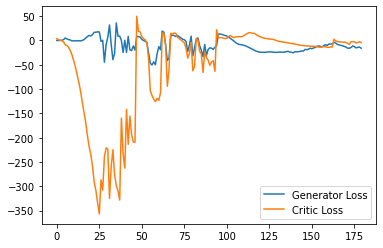

Step 3650: Generator loss: -17.821169319152833, critic loss: -9.680734403610229


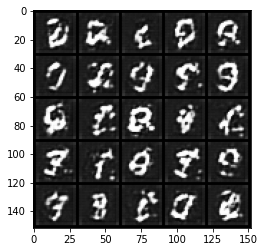

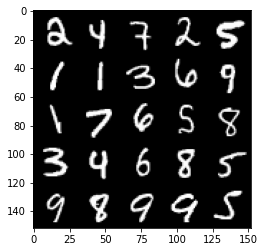

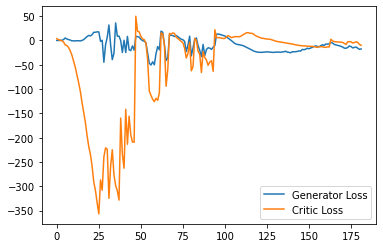

Step 3700: Generator loss: -16.717294006347657, critic loss: -10.724819331169128


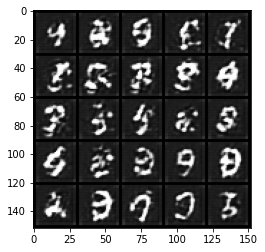

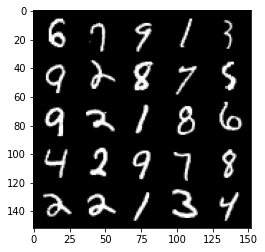

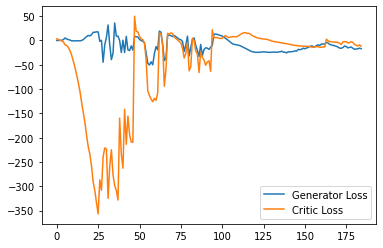

Step 3750: Generator loss: -15.60153923034668, critic loss: -12.162394049644467


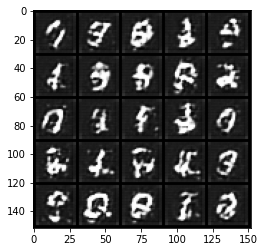

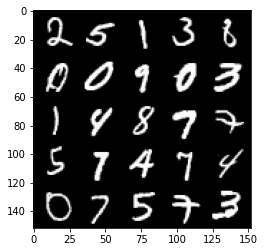

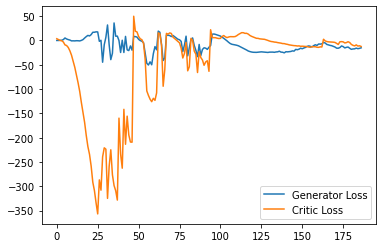

Step 3800: Generator loss: -14.871935558319091, critic loss: -13.862734794616705


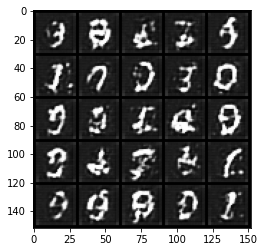

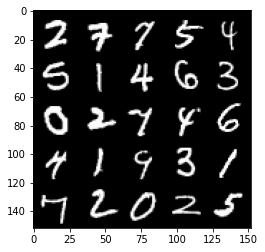

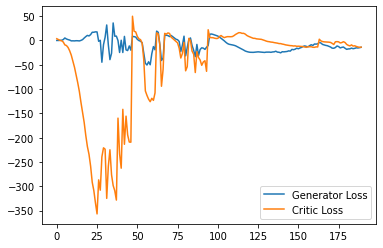

Step 3850: Generator loss: -14.414513807296753, critic loss: -15.009262922286982


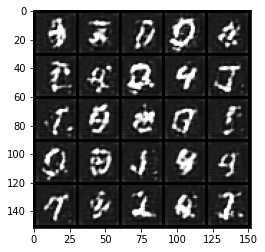

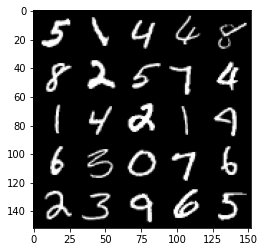

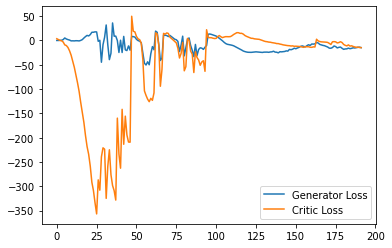

Step 3900: Generator loss: -13.335596895217895, critic loss: -14.747310721397396


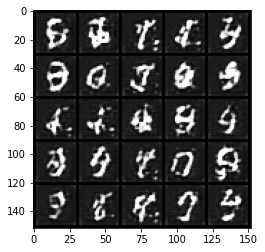

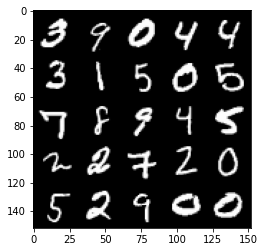

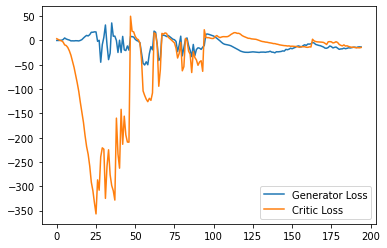

Step 3950: Generator loss: -13.464459037780761, critic loss: -15.55331307220459


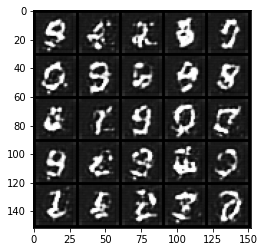

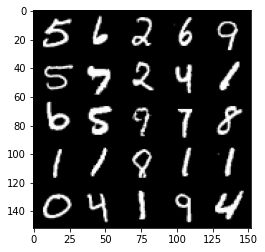

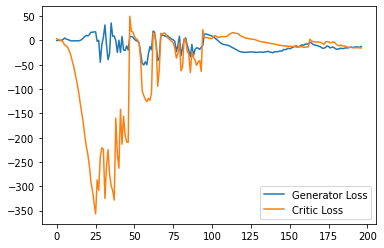

Step 4000: Generator loss: -11.182041482925415, critic loss: -15.151082617759698


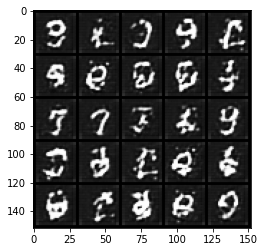

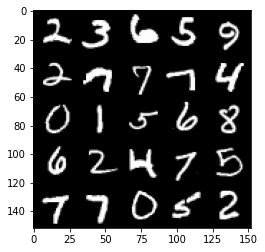

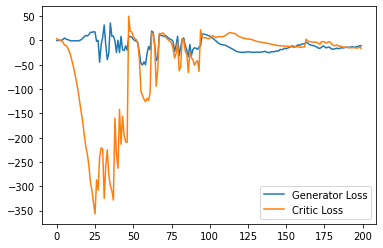

Step 4050: Generator loss: -11.025995988845825, critic loss: -16.137563302993783


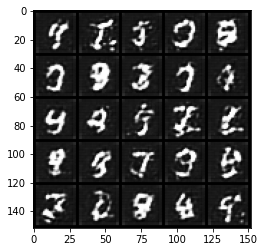

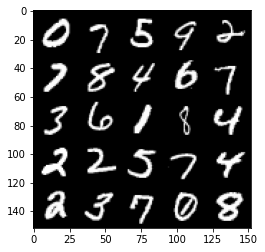

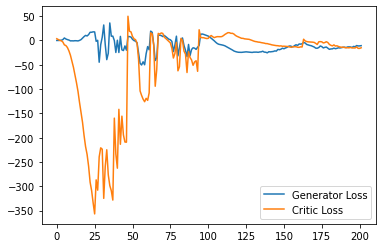

Step 4100: Generator loss: -11.431341352462768, critic loss: -14.603216923713685


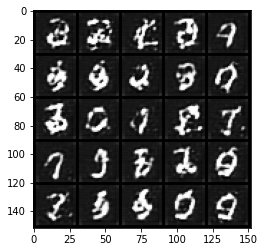

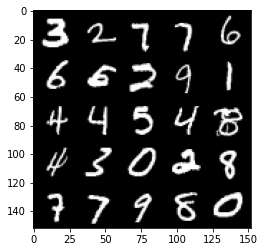

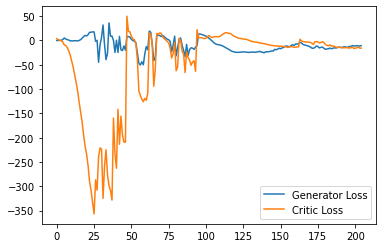

Step 4150: Generator loss: -7.436118016242981, critic loss: -10.104558176040651


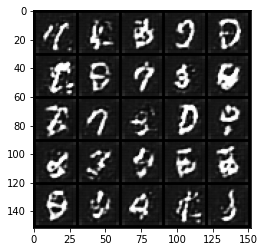

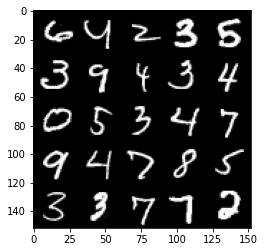

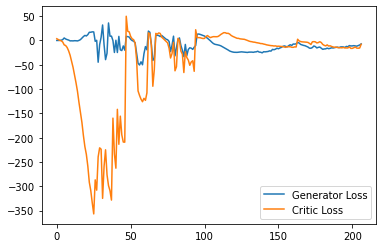

Step 4200: Generator loss: -10.0160906124115, critic loss: -14.685256180763242


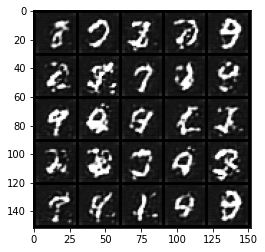

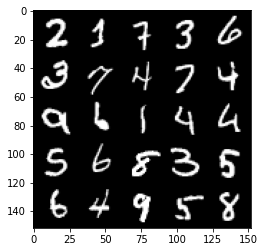

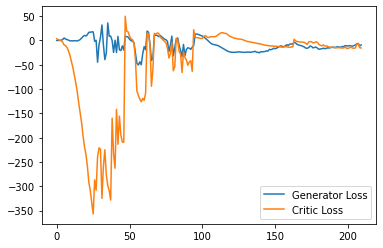

Step 4250: Generator loss: -7.533970081806183, critic loss: -10.997239528656005


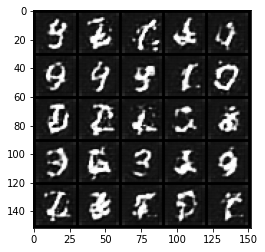

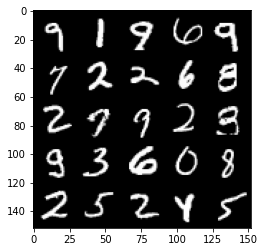

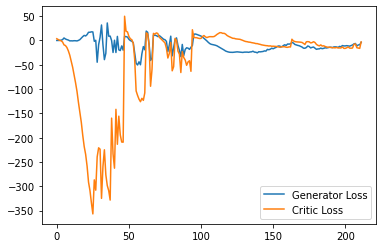

Step 4300: Generator loss: -9.572650799751282, critic loss: -14.401947409629818


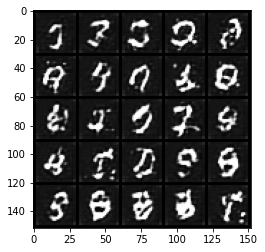

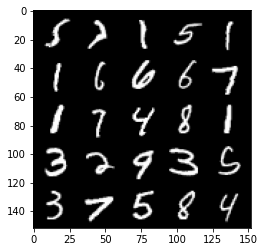

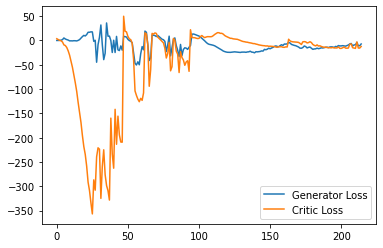

Step 4350: Generator loss: -8.323994309306144, critic loss: -14.004584968566899


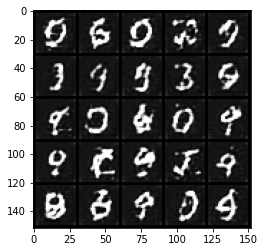

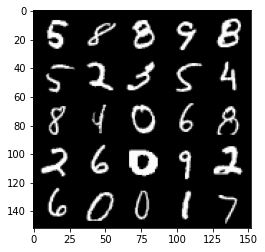

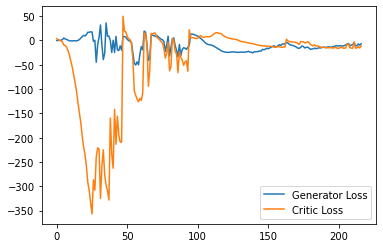

Step 4400: Generator loss: -7.057464809417724, critic loss: -15.031316590309142


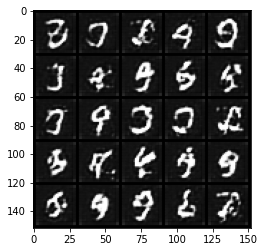

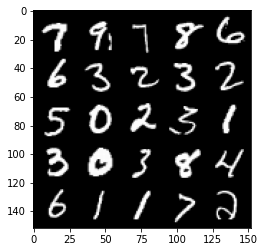

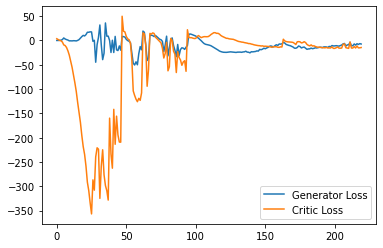

Step 4450: Generator loss: -2.660903578400612, critic loss: -7.256848596572874


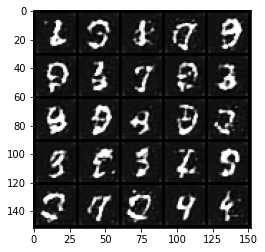

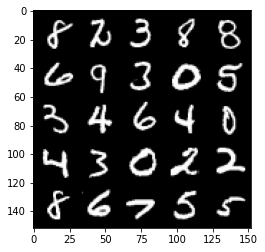

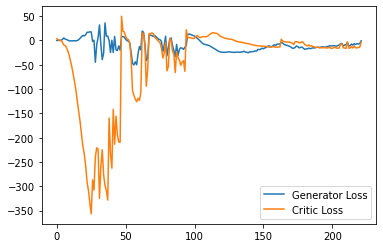

Step 4500: Generator loss: -3.97181315690279, critic loss: -6.629547591209411


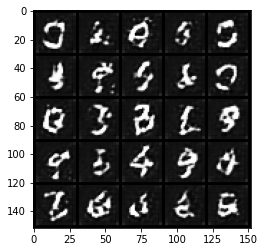

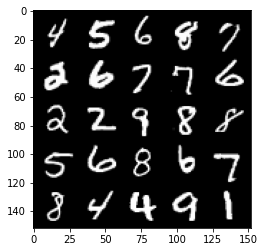

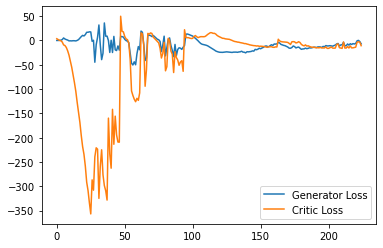

Step 4550: Generator loss: -6.381428666710853, critic loss: -12.525265448570254


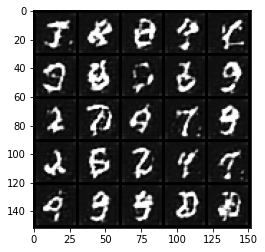

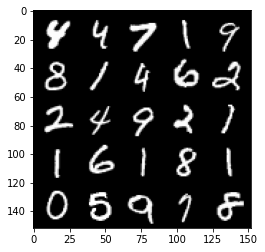

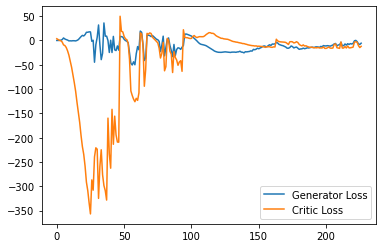

Step 4600: Generator loss: -6.930281443595886, critic loss: -15.1007860622406


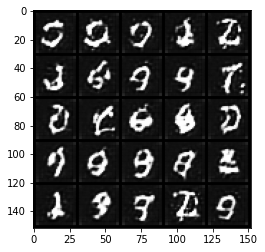

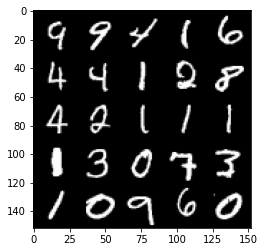

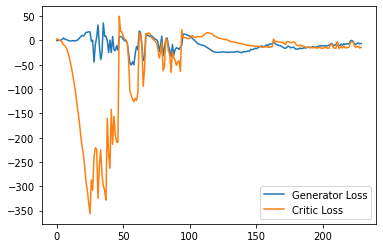

Step 4650: Generator loss: -5.507222644090652, critic loss: -14.96277343463898


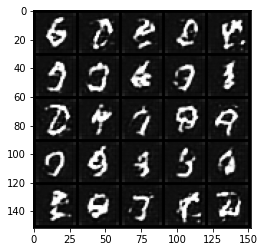

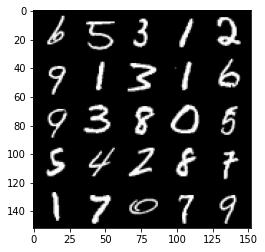

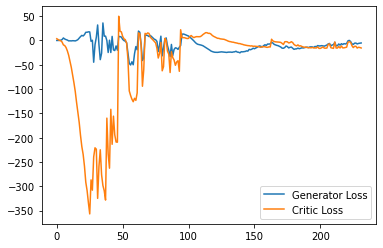

Step 4700: Generator loss: -0.5372861057519913, critic loss: -7.317870484828948


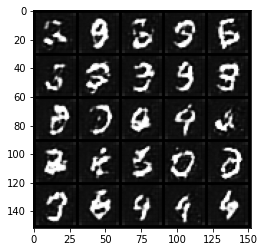

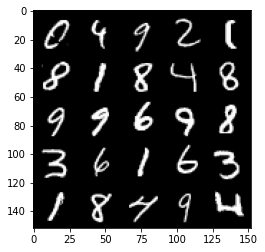

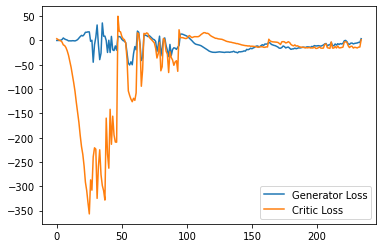

Step 4750: Generator loss: 0.6145809166878462, critic loss: -3.0522212591171267


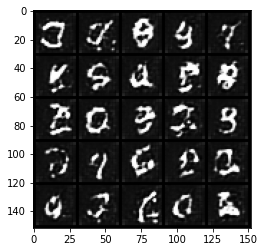

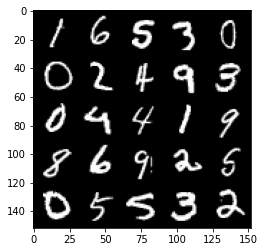

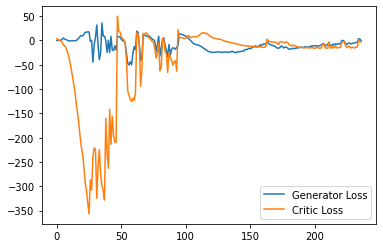

Step 4800: Generator loss: -3.547893108651042, critic loss: -4.264824585914613


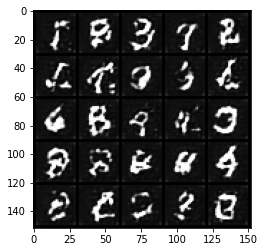

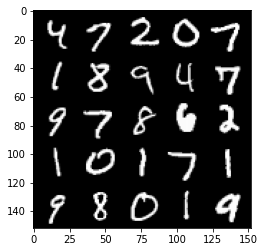

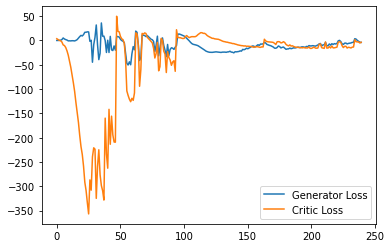

Step 4850: Generator loss: -2.9540154483914374, critic loss: -4.534301236152649


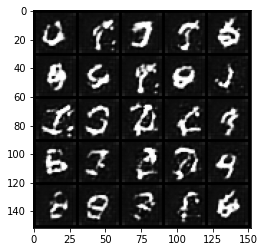

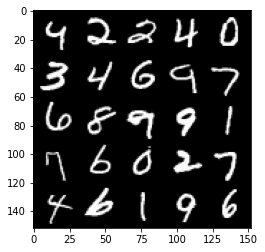

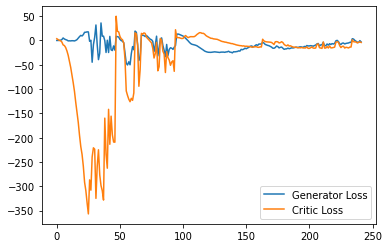

Step 4900: Generator loss: -8.794933362007141, critic loss: -12.743572693824767


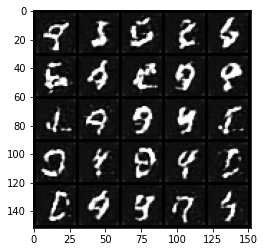

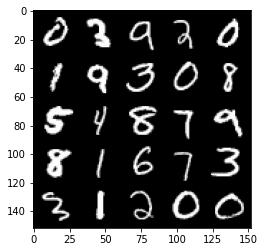

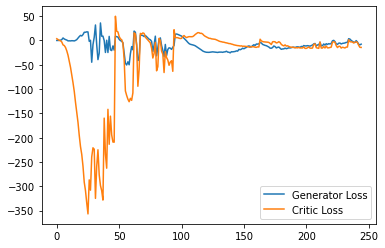

Step 4950: Generator loss: 0.6162099231779575, critic loss: -1.5154608249664303


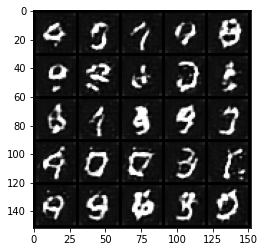

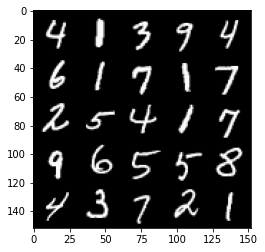

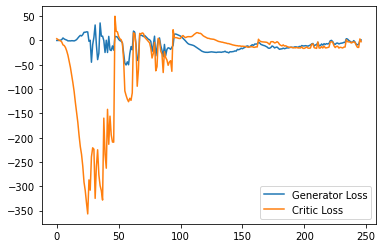

Step 5000: Generator loss: -2.6549463403224944, critic loss: -3.5223721590042114


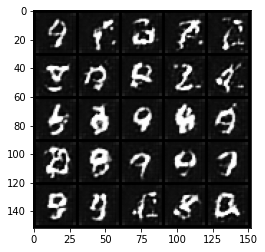

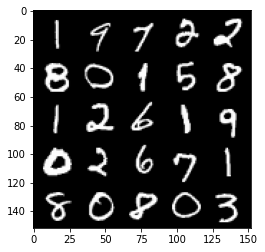

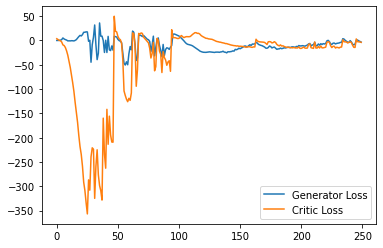

Step 5050: Generator loss: -8.336722767353058, critic loss: -10.786062696933747


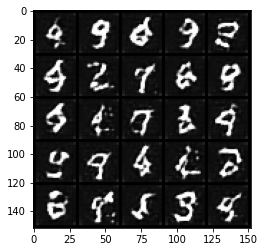

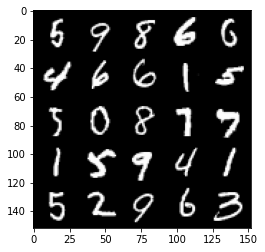

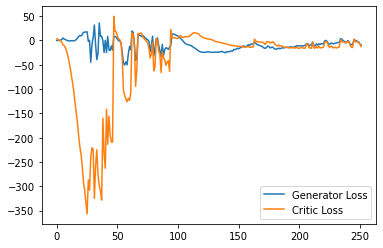

Step 5100: Generator loss: -5.532716829180718, critic loss: -12.518224042892454


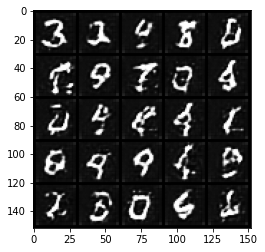

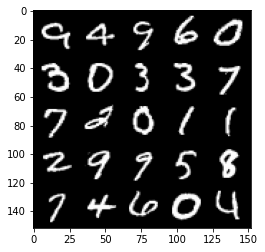

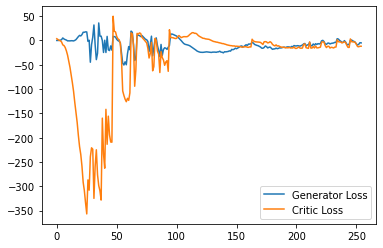

Step 5150: Generator loss: -1.4658477091789246, critic loss: -6.750204169750216


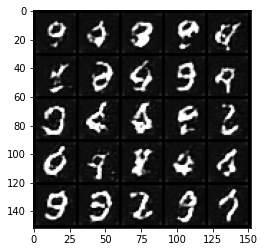

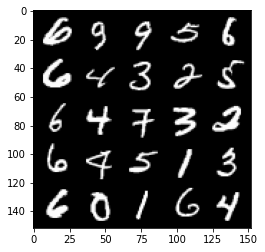

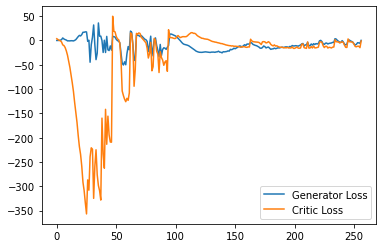

Step 5200: Generator loss: -0.6048735551536083, critic loss: -4.432619899749756


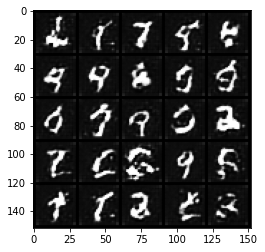

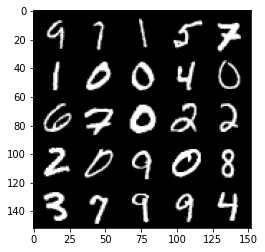

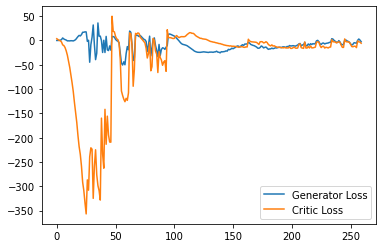

Step 5250: Generator loss: -4.754218515157699, critic loss: -8.714293919563293


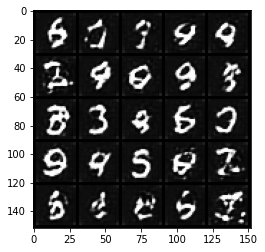

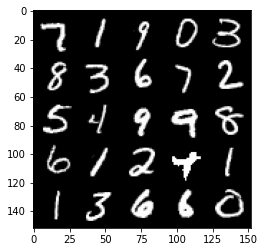

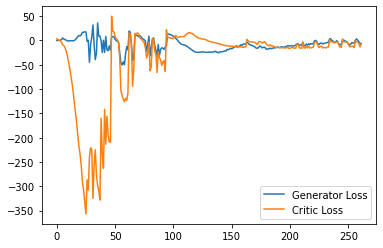

Step 5300: Generator loss: 0.5695549356937408, critic loss: -2.32711288022995


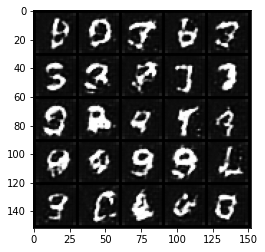

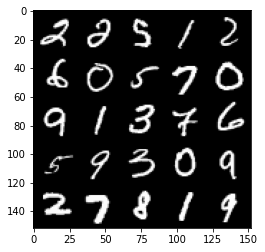

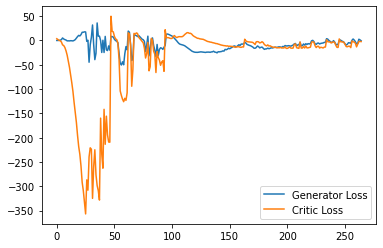

Step 5350: Generator loss: -2.819989285469055, critic loss: -2.744210633277893


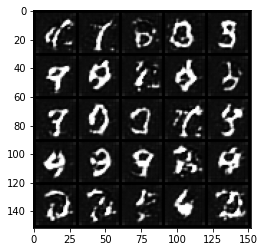

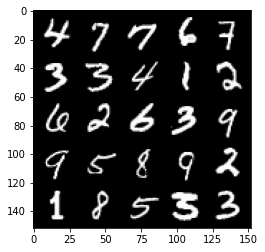

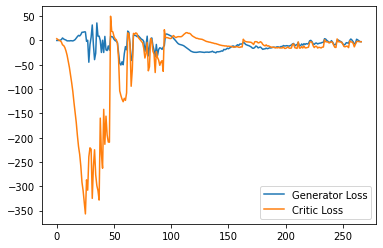

Step 5400: Generator loss: -5.6564644956588745, critic loss: -3.799649816513062


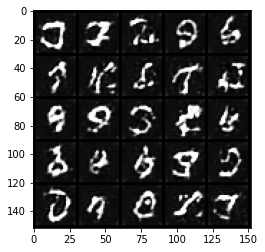

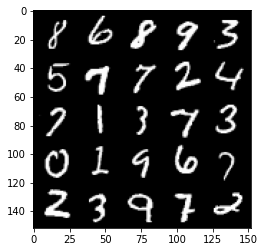

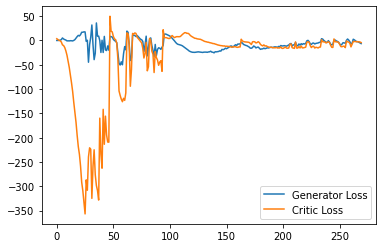

Step 5450: Generator loss: -10.617683026492596, critic loss: -12.532874824523926


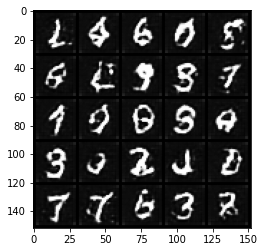

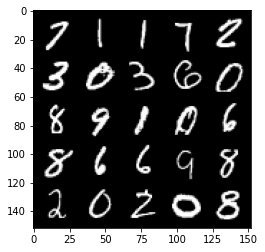

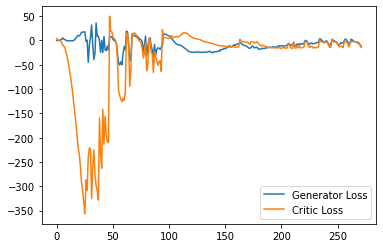

Step 5500: Generator loss: -6.8108846750855445, critic loss: -12.914760785579682


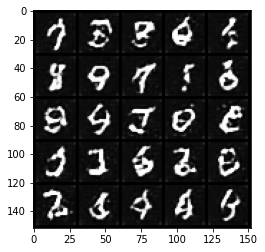

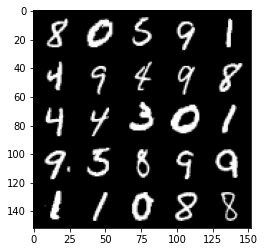

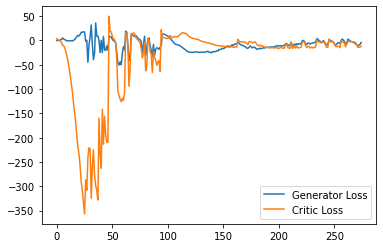

Step 5550: Generator loss: -5.189766023159027, critic loss: -7.903985842227937


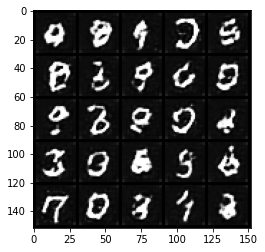

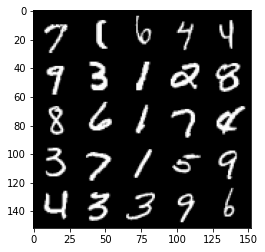

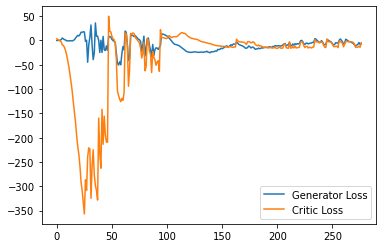

Step 5600: Generator loss: 0.8718905282393098, critic loss: -2.7959623279571537


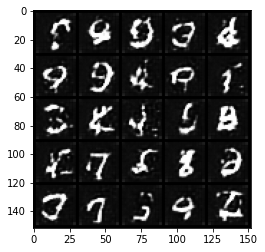

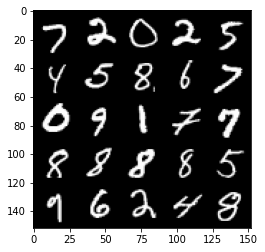

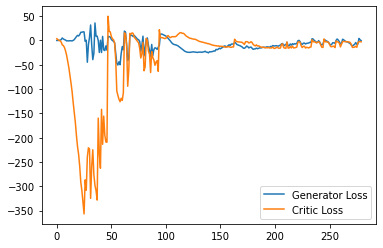

Step 5650: Generator loss: -2.8834650075435637, critic loss: -3.740247546195984


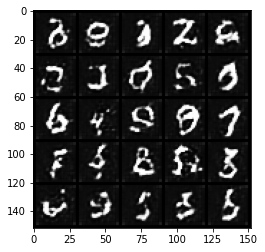

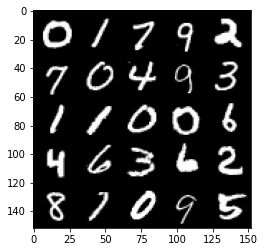

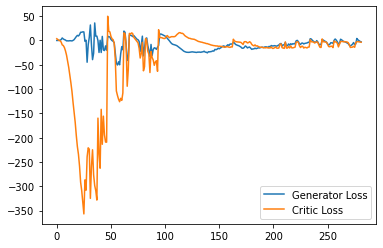

Step 5700: Generator loss: -4.82475094974041, critic loss: -6.20068103981018


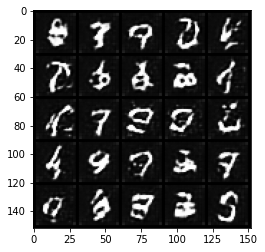

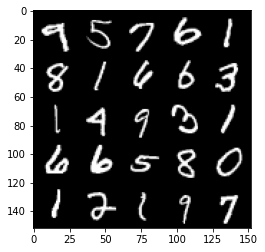

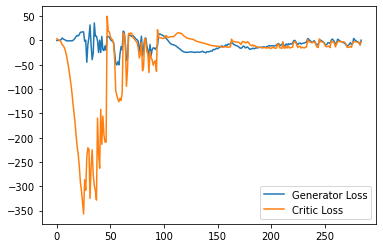

Step 5750: Generator loss: -7.935208906531334, critic loss: -13.223657455921177


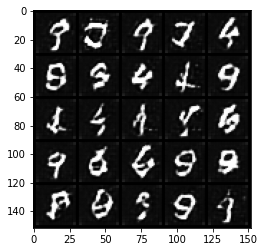

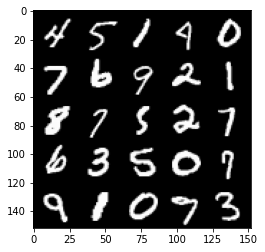

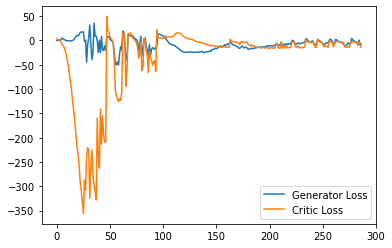

Step 5800: Generator loss: -2.224423277974129, critic loss: -3.2087048707008363


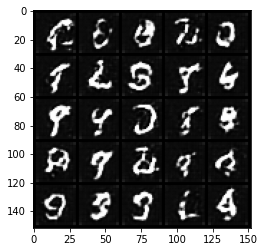

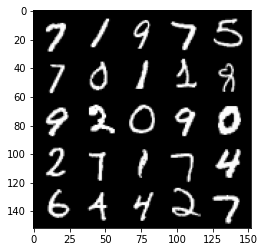

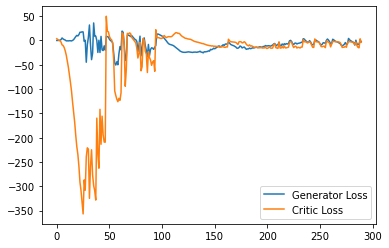

Step 5850: Generator loss: -4.799092120304704, critic loss: -10.038424354076383


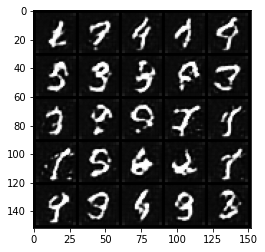

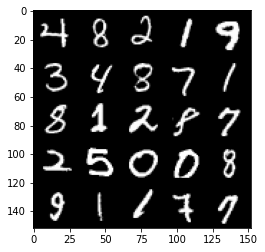

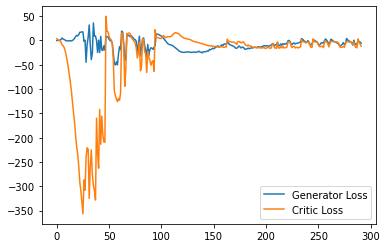

Step 5900: Generator loss: -4.823965433835983, critic loss: -13.421758344173432


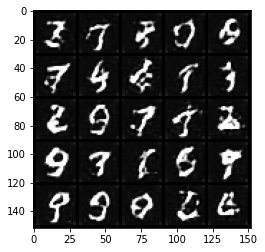

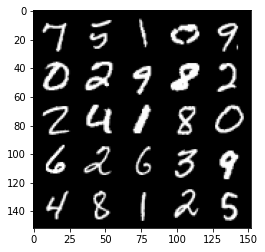

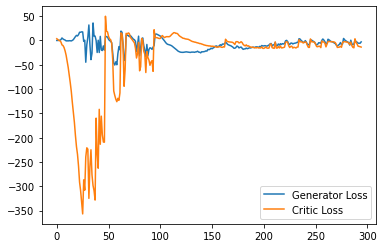

Step 5950: Generator loss: -4.752625077366829, critic loss: -14.17319481897354


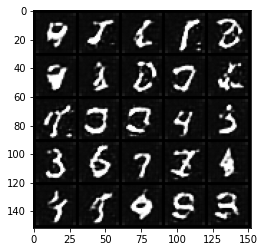

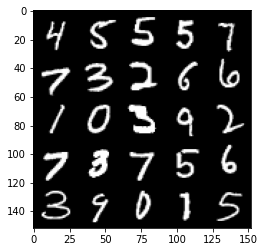

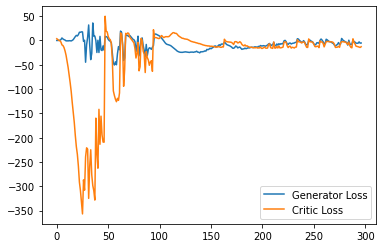

In [ ]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
